# Introduction: Exploration of an Alex Net Bird Classification Model
Date: 02/10/21


In [1]:
import torch
import matplotlib.pyplot as plt
import sys
import pandas as pd
import os
import numpy as np
sys.path.append("../") # moves sys path to parent which allows import of datasets module

from datasets.bird_dataset import BirdDataset
from torch.utils.data import DataLoader
from torchvision.transforms import ToPILImage
from torchvision import transforms
from torch.nn.functional import softmax
from PIL import Image
from lime import lime_image
from skimage.segmentation import mark_boundaries

In [2]:
def get_image(tensor: torch.Tensor) -> Image:
    """
    reverse the normalization and returns Image obj w/ RGB
    """
    # imgNet mean, and std
    # should match bird_datasets values
    means = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    stds = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    unnorm_tensor = tensor * stds + means
    return ToPILImage(mode='RGB')(unnorm_tensor)

def multiclass_confusion_matrix(true_y: list, pred_y: list) -> list:
    """
    takes in 1d true y and 1d predictions and spits out a 2d matrix containing
    of the confusion matrix.
    
    y-axis label is true
    x-axis lable is prediction 
    
    true_y and pred_y should correspond to 0 to k int labels
    """
    num_classes = len(np.unique(true_y))
    matrix = np.zeros((num_classes, num_classes))
    for i in range(len(true_y)):
        matrix[pred_y[i]][true_y[i]] += 1
    return matrix

In [3]:
# Intialization
LABEL_NAMES = tuple(os.listdir(f"../data/images/"))
test_dataset = BirdDataset(csv_path="../data/bird_test.csv", root_dir="../data/images")
test = DataLoader(test_dataset, batch_size=1)
model = torch.load("../models/completed_models/alex_bird_classifier")

In [4]:
# Test Accuracy
num_correct = 0
with torch.no_grad(): # reduce memory comsumption
    for data, labels in test:
        predictions = model(data)
        num_correct += (predictions.argmax(axis=1) == labels).sum()
print(float(num_correct) / len(test_dataset))

0.8684931506849315


The model is an pretrained Alex Net with the the last layer unfrozen. See `../models/generate_model.py` for implementation. We see that we have a model accuracy of ~90%, cropped, and about 87% full image. We'll want to first implement a confusion matrix to see the general error

In [5]:
predicted_labels = []
true_labels = []
imgdata = []

with torch.no_grad(): # reduce memory comsumption
    for data, label in test:
        predictions = model(data)
        label_name = LABEL_NAMES[label]
        predicted_labels.append(predictions.argmax(axis=1)[0])
        true_labels.append(int(label[0]))
        imgdata.append({
                "data": data,
                "actual": label_name,
                "predicted": LABEL_NAMES[predictions.argmax(axis=1)[0]]
        })

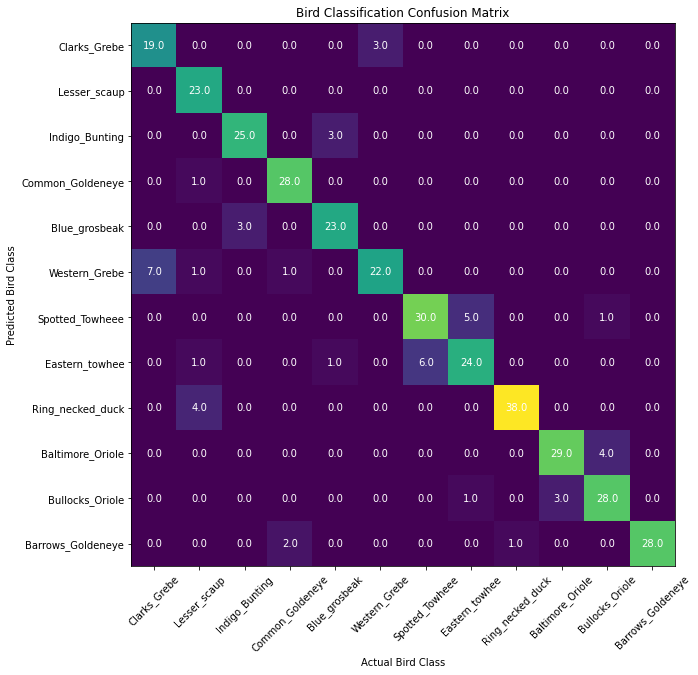

In [6]:
matrix = multiclass_confusion_matrix(true_labels, predicted_labels)

fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(matrix)
plt.xticks(np.arange(len(LABEL_NAMES)), LABEL_NAMES, rotation=45)
plt.xlabel("Actual Bird Class")
plt.yticks(np.arange(len(LABEL_NAMES)), LABEL_NAMES)
plt.ylabel("Predicted Bird Class")
plt.title("Bird Classification Confusion Matrix")

for i in range(len(LABEL_NAMES)):
    for j in range(len(LABEL_NAMES)):
        text = ax.text(j, i, matrix[i, j],
                       ha="center", va="center", color="w")

plt.show()

Here we see some important confusion points:
* Clarks Grebe and Western Grebe have the highest error rate 
* Baltimore_Oriole and Bullocks_Oriole have the second highest error rate mixup
* Spotted_Towheee and Eastern_towhee have the third highest error rate
* Indigo Bunting and Blue Grosbeak
  * only w/ full imaging

Judging by the naming of the three pairs, it is quite possible that because they are of similar species, theyre appearances are similar hence the model had difficulty discerning the differences between the two species. If we were to quanitify this errorage, use the f1 score on a binary classification containing the two species.

Note: A better visualization would require some interactivity: click box to expand the image samples. Unfortunately this functionality is difficult and time consuming in matplotlib/seaborn. D3.js would be the better tool. For now, a quick script works "good enough" as seen right below

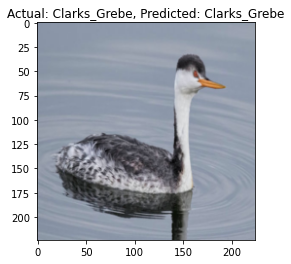

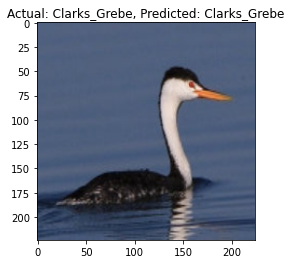

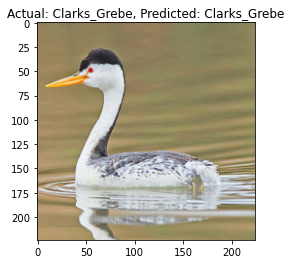

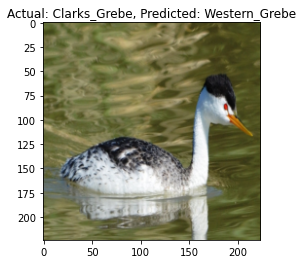

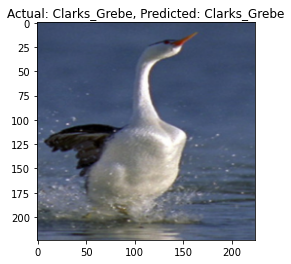

...

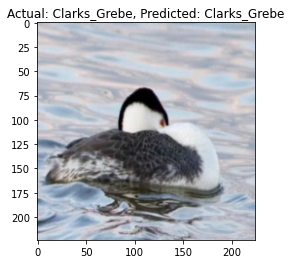

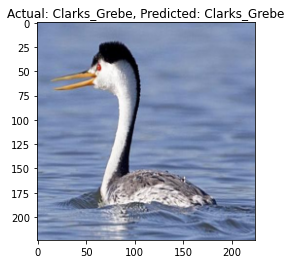

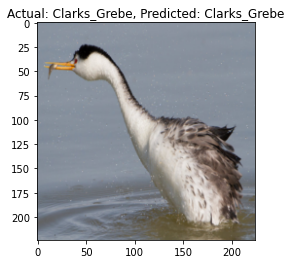

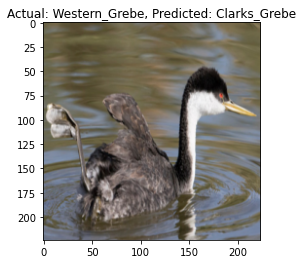

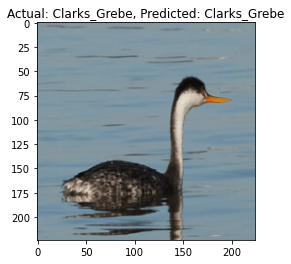

In [7]:
# CHANGE ME to look at other bird comparisons
actual_label_ft = "Clarks_Grebe"
predicted_label_ft = "Clarks_Grebe"

for error in imgdata:
    if error["actual"] == actual_label_ft or error["predicted"] == predicted_label_ft:
        plt.imshow(get_image(error["data"][0]))
        plt.title(f"Actual: {error['actual']}, Predicted: {error['predicted']}")
        plt.show()

In a large portion of the mistakes seen in the clarks grebe, the mistakes come from the certain features (specifically the beak) being completely or partially cropped off. There is one image where the full body is present, but we see that there is a mistaken attribution. It'd be interesting to explore this image specifically.

Lets do some background research on the differences btwn Clark's Grebe and the Western Grebe.

Based on this [source](https://www.thespruce.com/clarks-or-western-grebe-387333), there are a few key physical features to look for:


| Characteristic | Clark's Grebe | Western Grebe |
| -- | -- | -- |
| Face | Dark cap stops above the eye | Dark Cap extends below the eye |
| Bill | Bright yellow or yellow-orange | Olive yellow and gray |
| Neck | Thin dark stripe on back | Think dark stripe on back |
| Plumage | Gray with light flanks | Dark gray or black, darker flanks |
| Wings | More white in flight feathers | Less white in flight feathers |

More generally, it appears that the Western Grebe is darker than the Clark's Grebe

Like-wise, if the model picks up these signals, the areas of interest will be the face region since the coloration between the dark and light grays can be difficult to obfuscate due to the different types of cameras and processing used to capture the images

In [8]:
# Pull images
cat = os.listdir("../data/images")
dirs = [os.path.join("../data/images", d) for d in cat]
clarks = [os.path.join(dirs[0], f) for f in os.listdir(dirs[0])]
western = [os.path.join(dirs[5], f) for f in os.listdir(dirs[5])]
grebe_files = []
grebe_files.extend(clarks)
grebe_files.extend(western)
RANDOM_STATE=42
torch.manual_seed(RANDOM_STATE)

# training transformers
crop = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.CenterCrop(224)
])

normalize = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]) 
    ])    

# explanatory transformers
random_crop = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomCrop(224)
])

horizontal_flip = transforms.RandomHorizontalFlip(1)
random_rotation = transforms.RandomRotation((-30, 30))

def lime_model(images):
    batch = torch.stack([normalize(i) for i in images])
    logits = model(batch)
    probs = softmax(logits, dim=1)
    return probs.detach().numpy()

def getCollection(image):
    """
    returns a small number of transformations
    """
    img_arr = []
    img_arr.append(crop(image))
    img_arr.append(horizontal_flip(crop(image)))
    rotated_img = random_rotation(image)
    cropped_rotated_img = random_crop(rotated_img)
    img_arr.append(cropped_rotated_img)
    img_arr.append(horizontal_flip(cropped_rotated_img))
    return img_arr

In [9]:
# from lime.wrappers.scikit_image import SegmentationAlgorithm
# in case we want to use a different segmenatation algo, modify explainer param

----------------------------------------------------

Image: 0
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


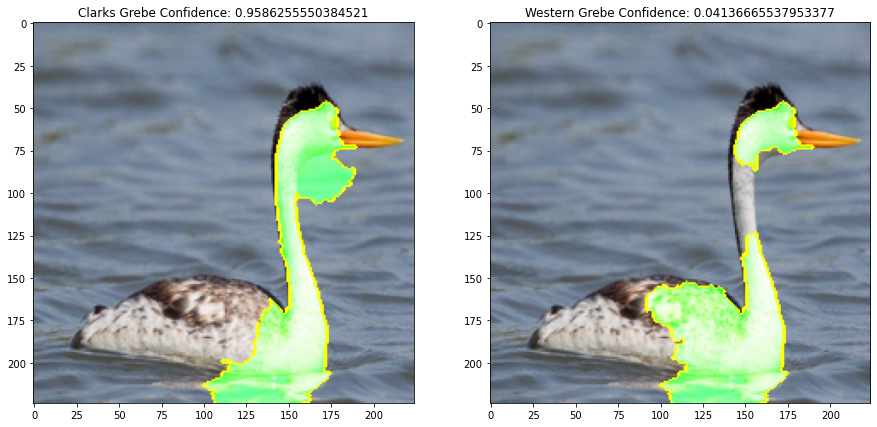


Image: 1
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


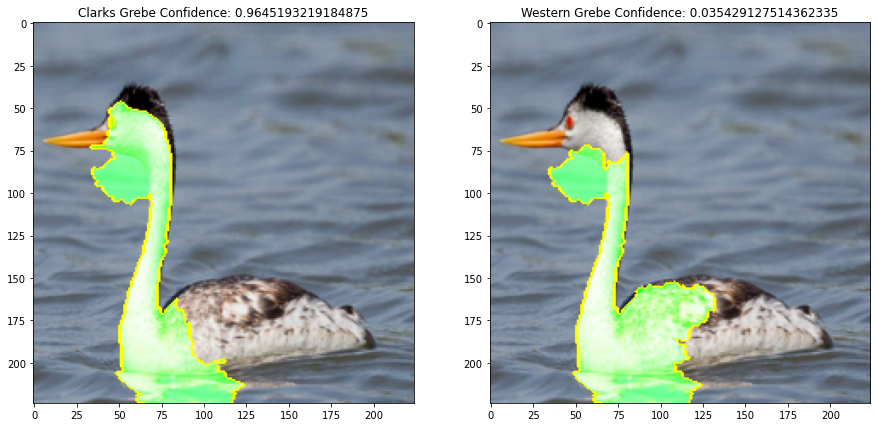


Image: 2
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


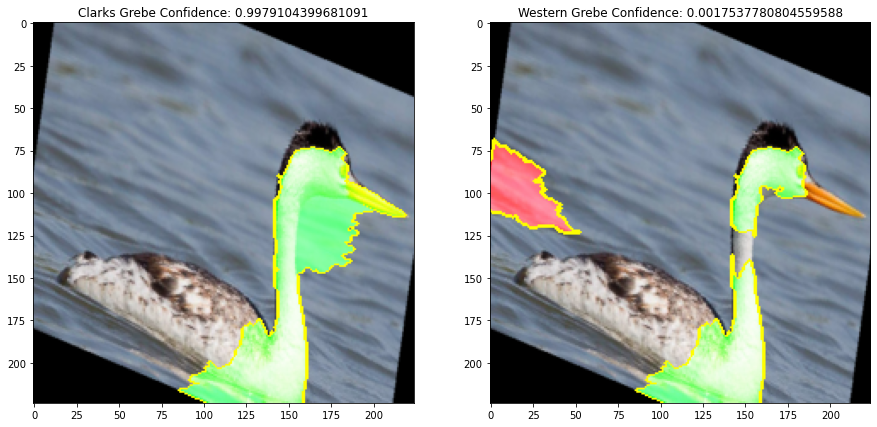


Image: 3
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


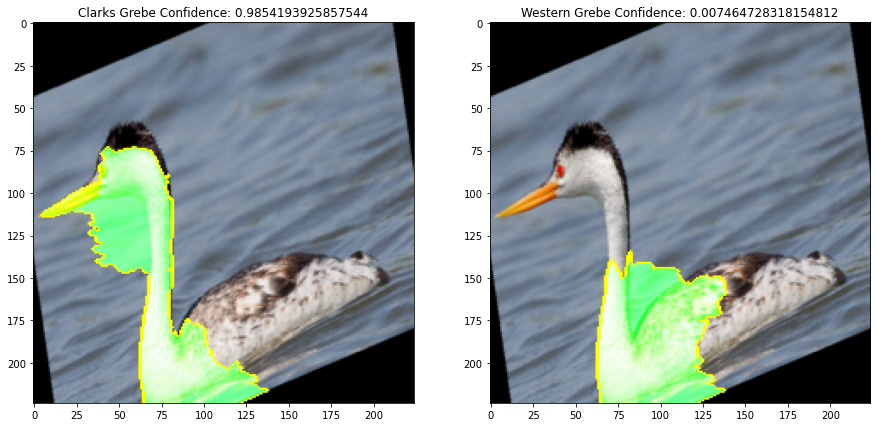

----------------------------------------------------

Image: 4
Actual: Western_Grebe
Predicted: Western_Grebe


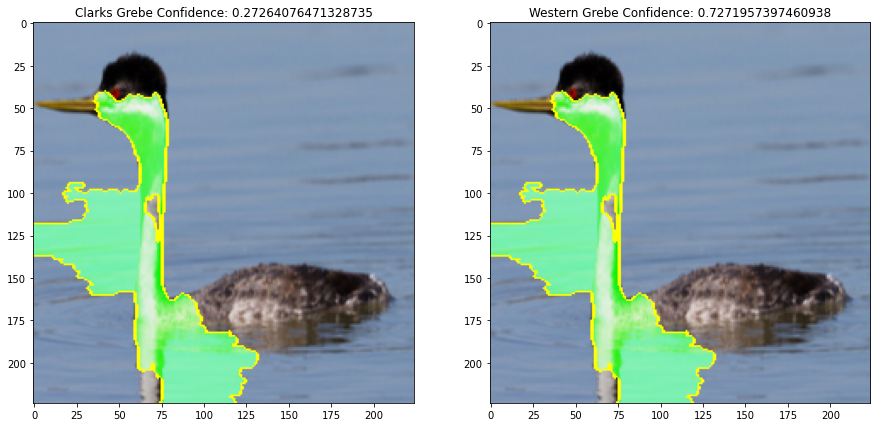


Image: 5
Actual: Western_Grebe
Predicted: Western_Grebe


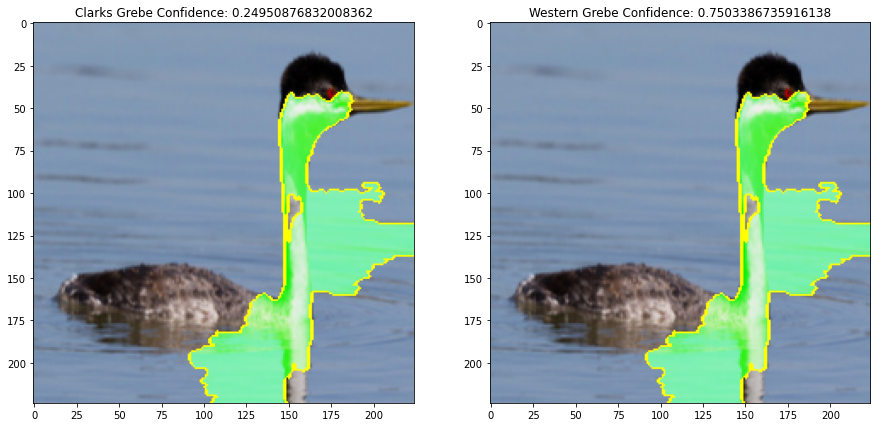


Image: 6
Actual: Western_Grebe
Predicted: Clarks_Grebe


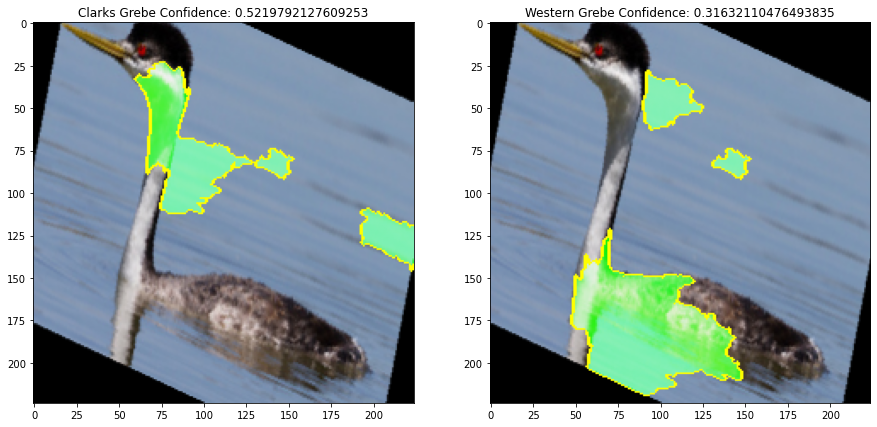


Image: 7
Actual: Western_Grebe
Predicted: Clarks_Grebe


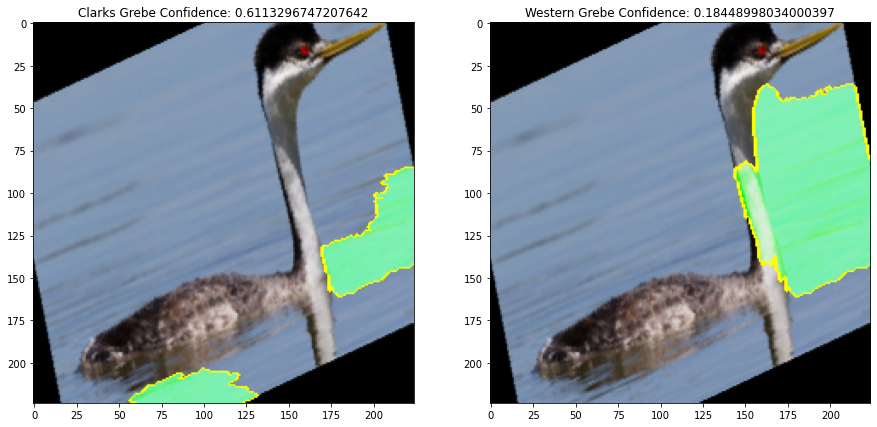

----------------------------------------------------

Image: 8
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


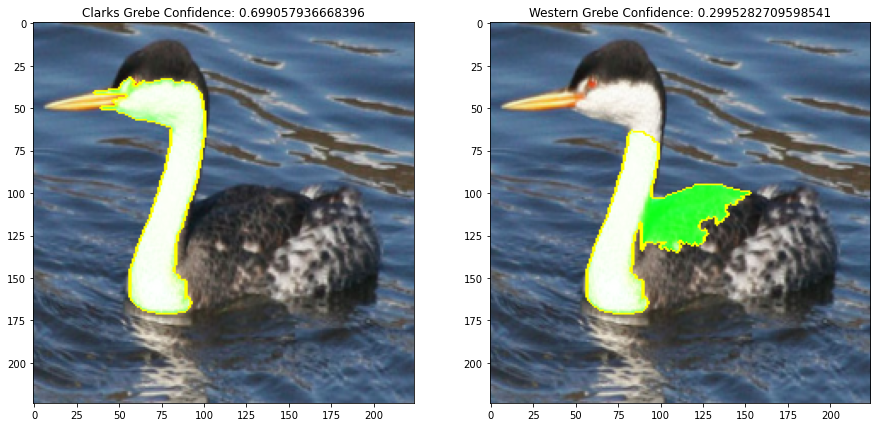


Image: 9
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


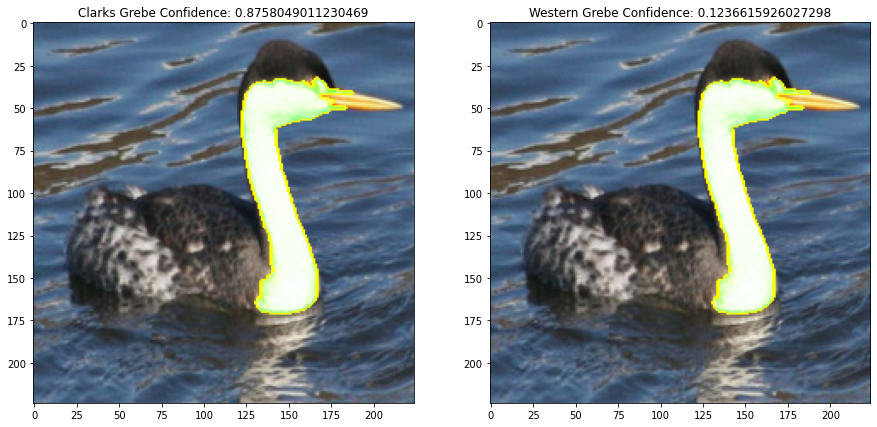


Image: 10
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


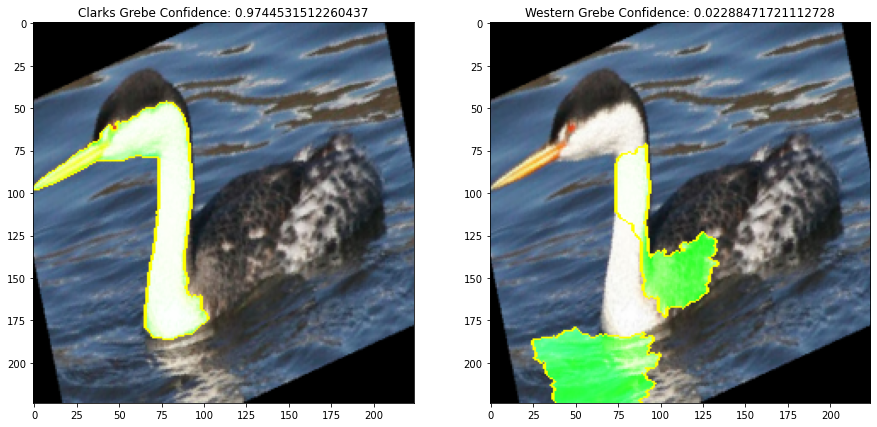


Image: 11
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


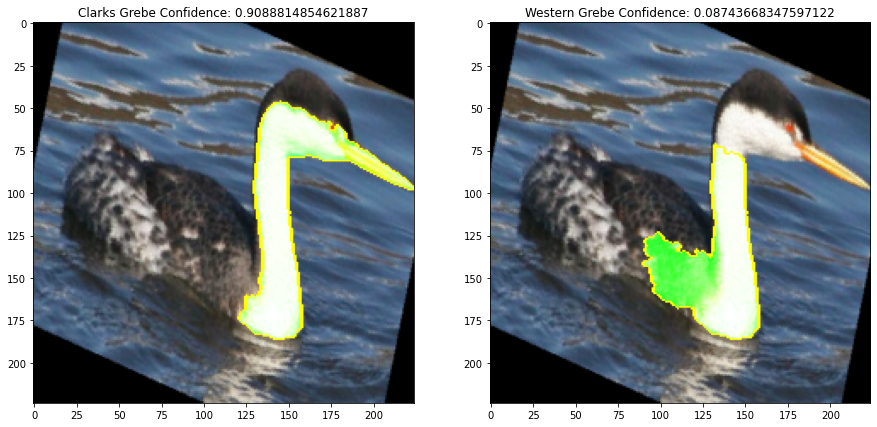

----------------------------------------------------

Image: 12
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


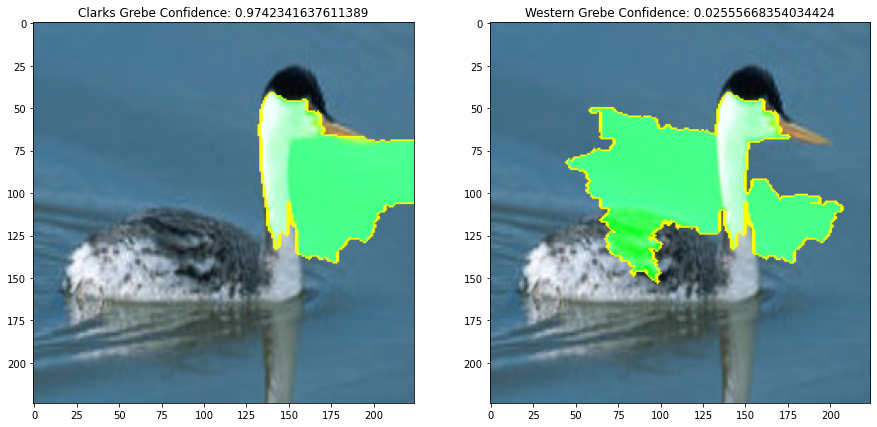


Image: 13
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


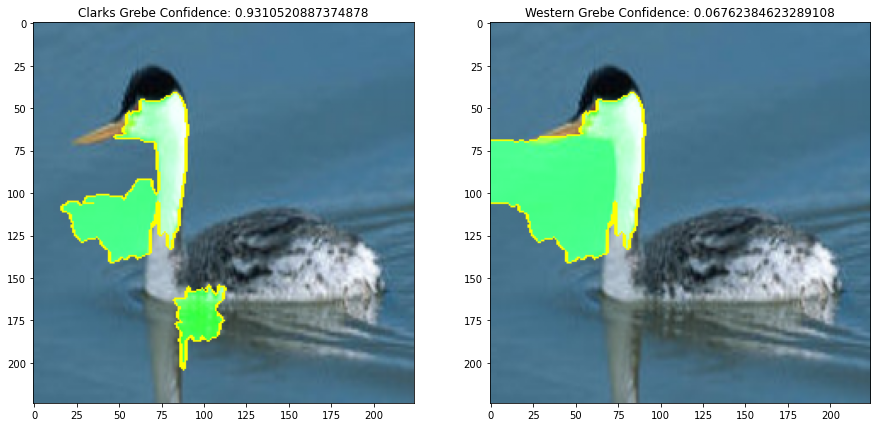


Image: 14
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


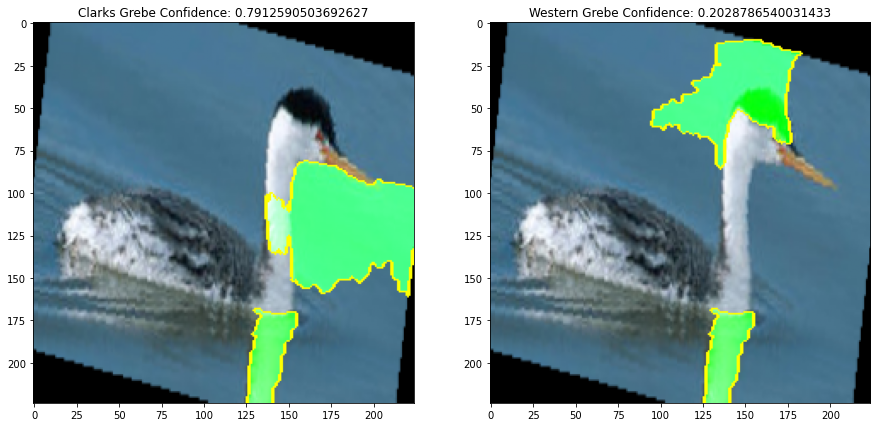


Image: 15
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


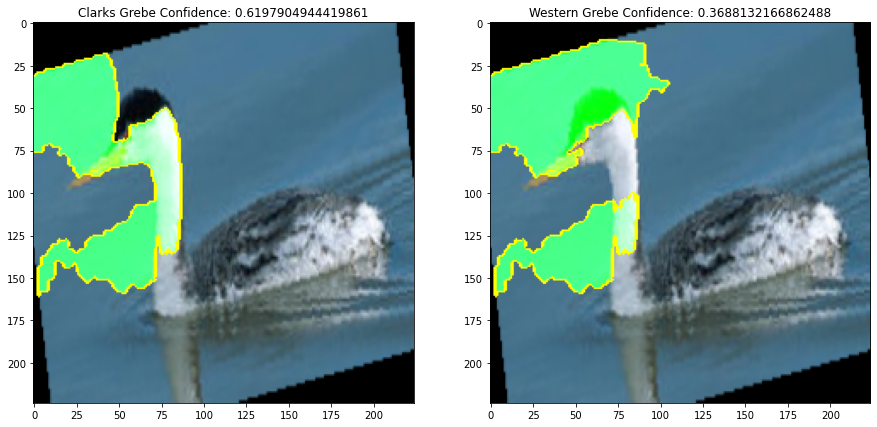

----------------------------------------------------

Image: 16
Actual: Western_Grebe
Predicted: Western_Grebe


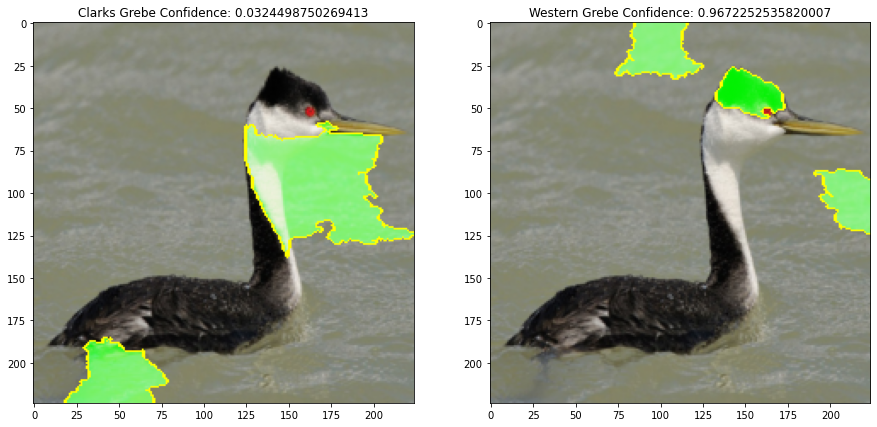


Image: 17
Actual: Western_Grebe
Predicted: Western_Grebe


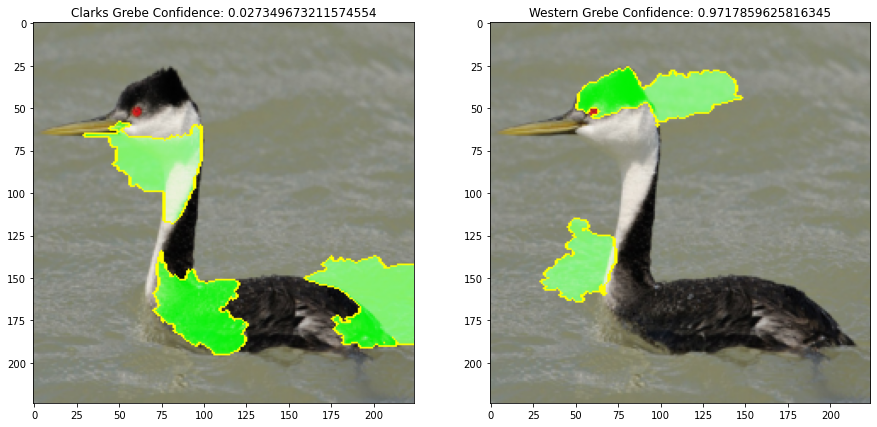


Image: 18
Actual: Western_Grebe
Predicted: Western_Grebe


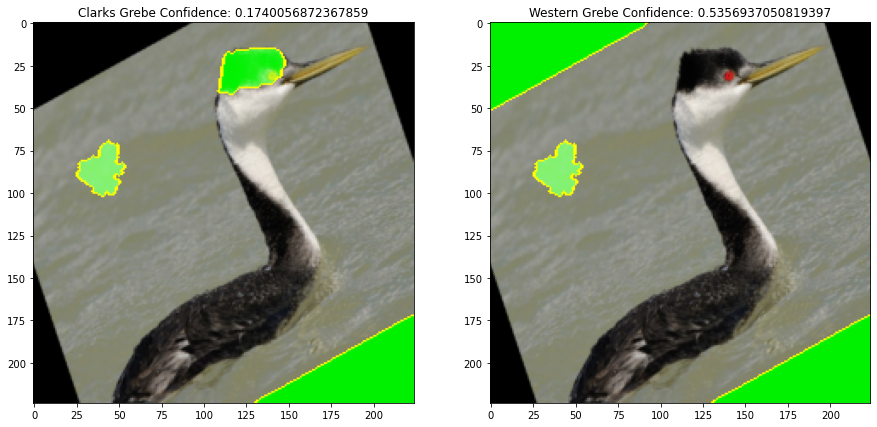


Image: 19
Actual: Western_Grebe
Predicted: Western_Grebe


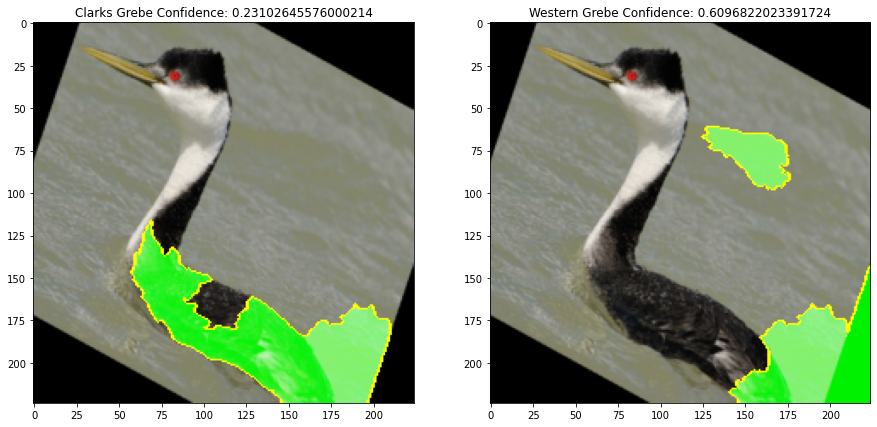

----------------------------------------------------

Image: 20
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


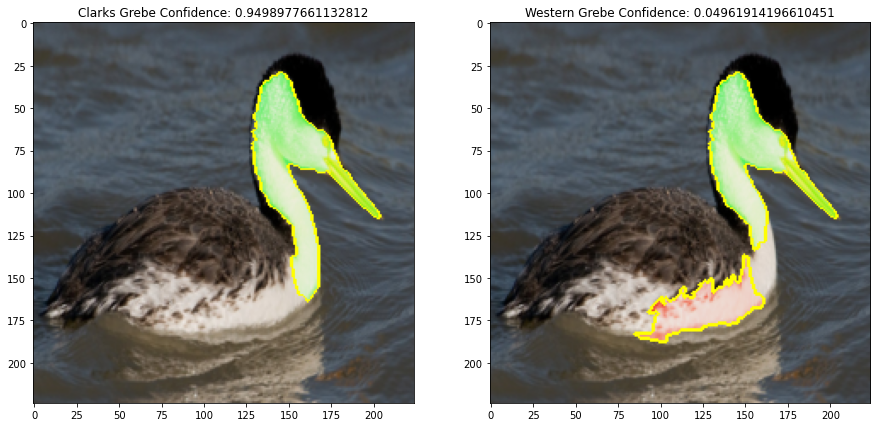


Image: 21
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


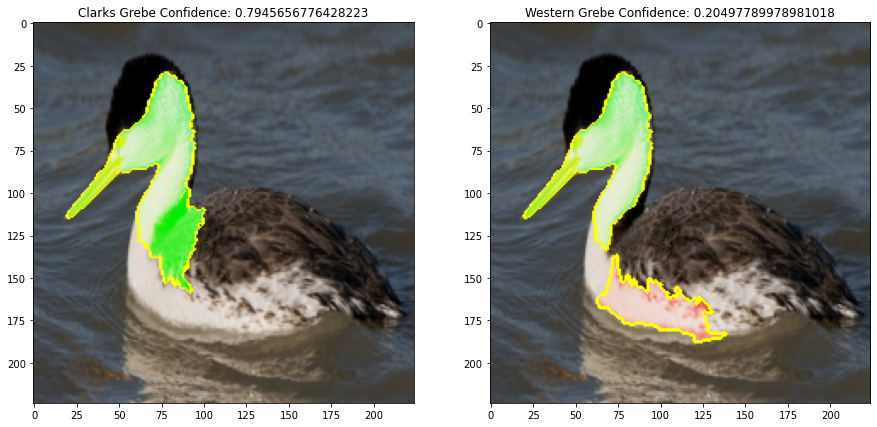


Image: 22
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


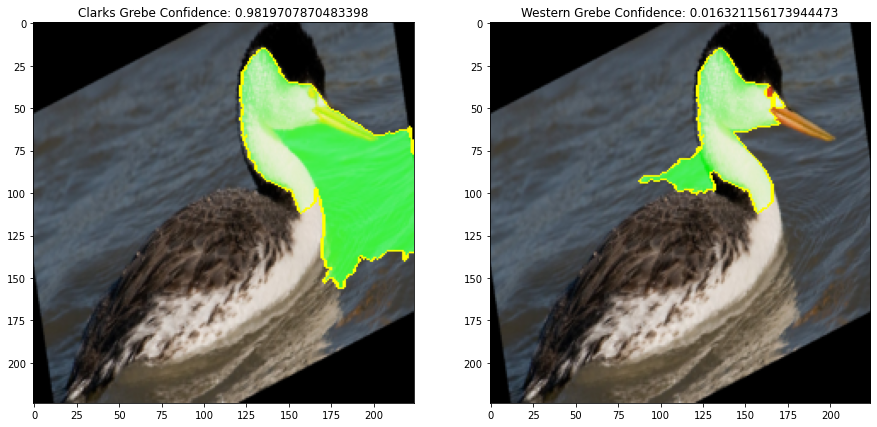


Image: 23
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


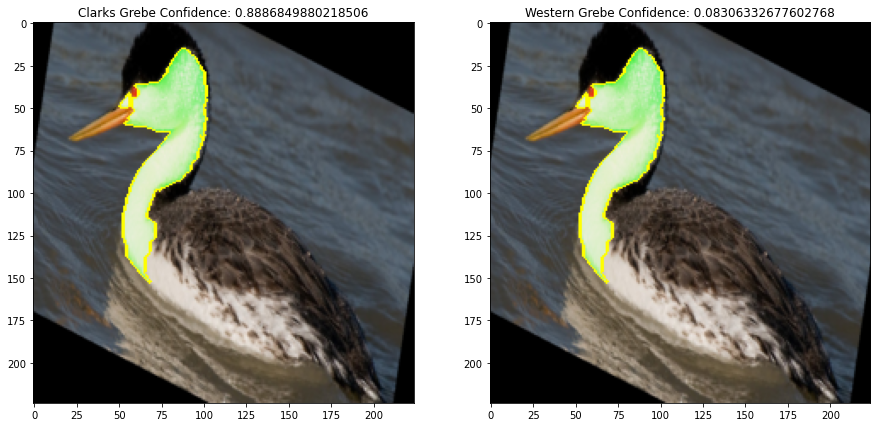

----------------------------------------------------

Image: 24
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


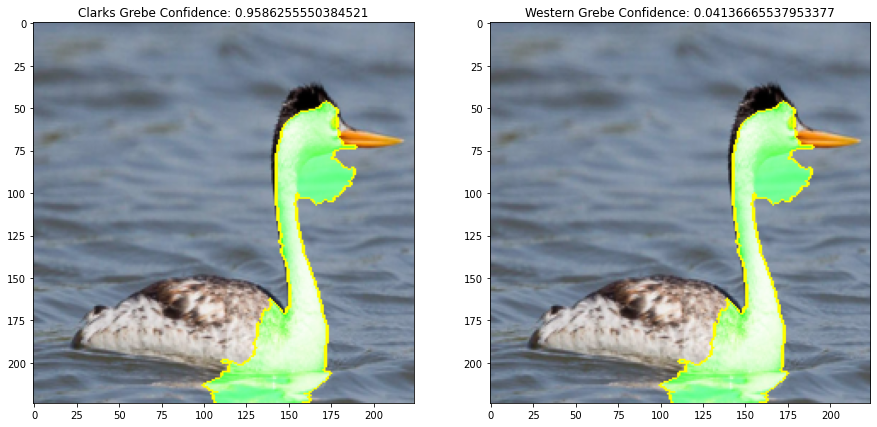


Image: 25
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


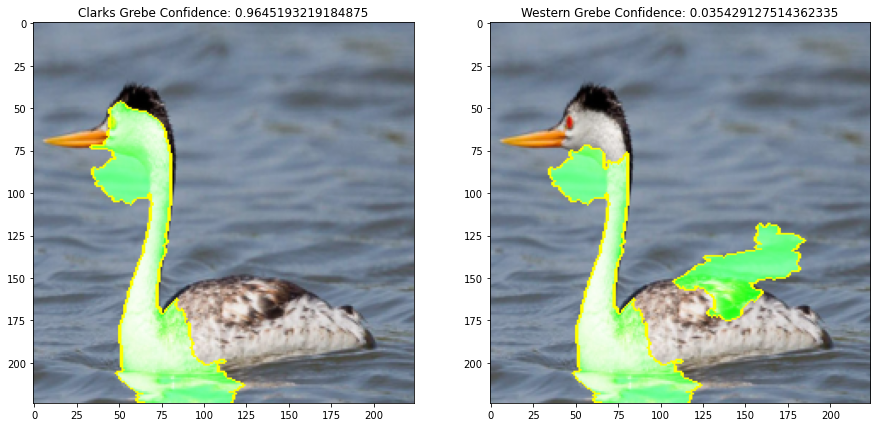


Image: 26
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


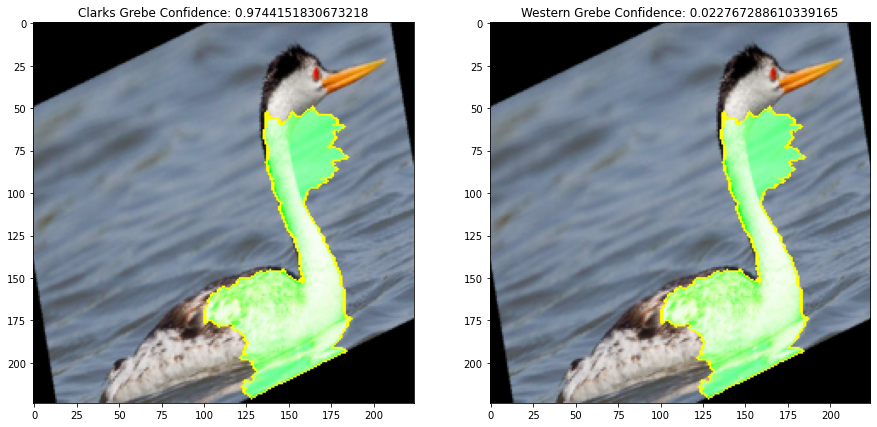


Image: 27
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


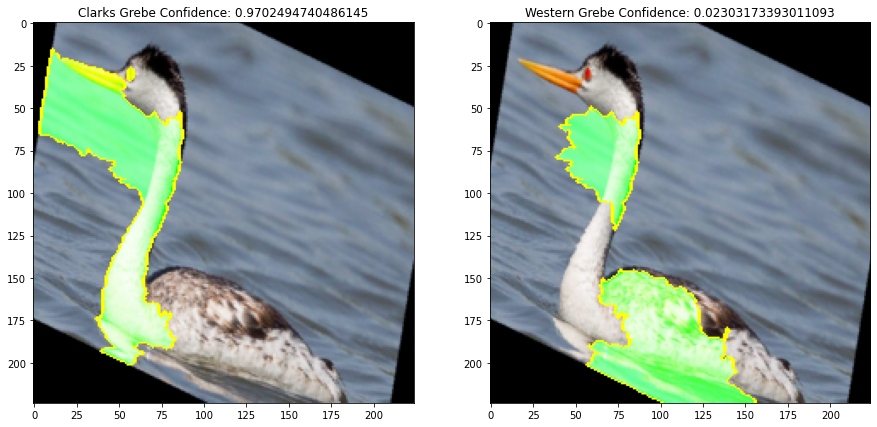

----------------------------------------------------

Image: 28
Actual: Clarks_Grebe
Predicted: Western_Grebe


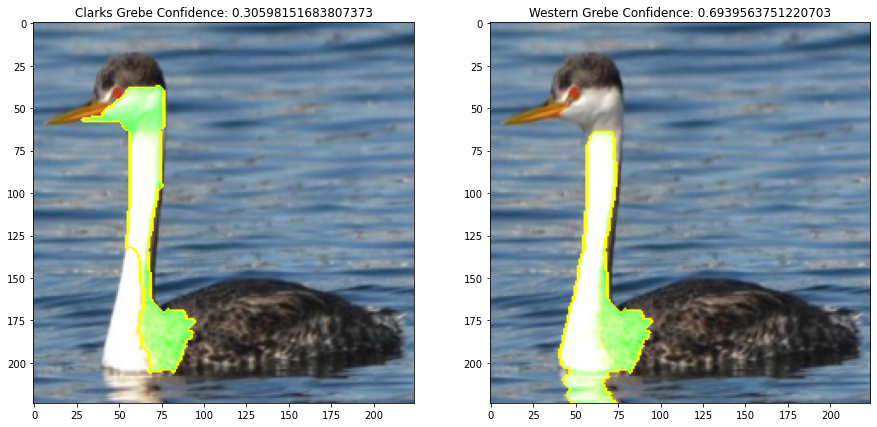


Image: 29
Actual: Clarks_Grebe
Predicted: Clarks_Grebe


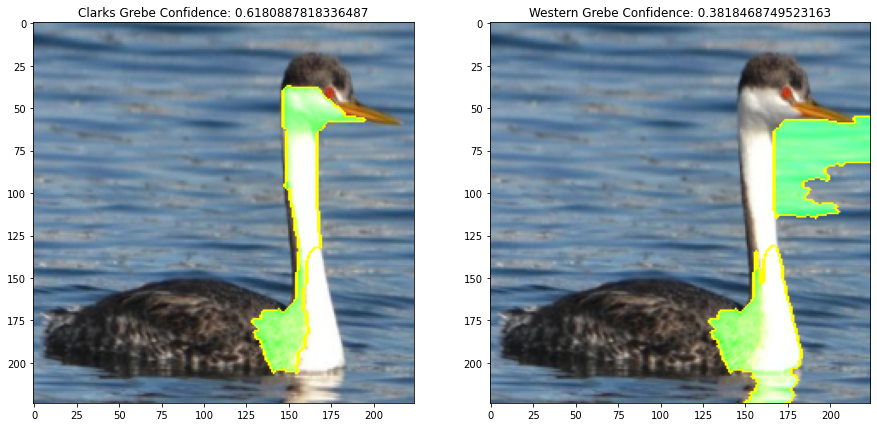


Image: 30
Actual: Clarks_Grebe
Predicted: Western_Grebe


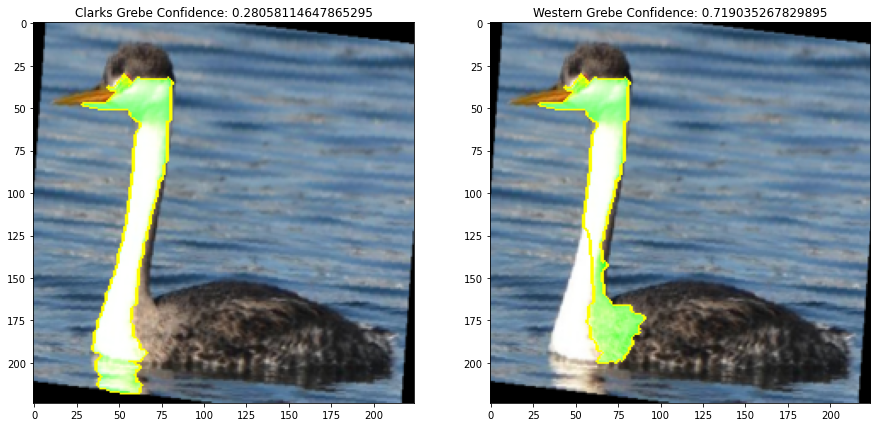


Image: 31
Actual: Clarks_Grebe
Predicted: Western_Grebe


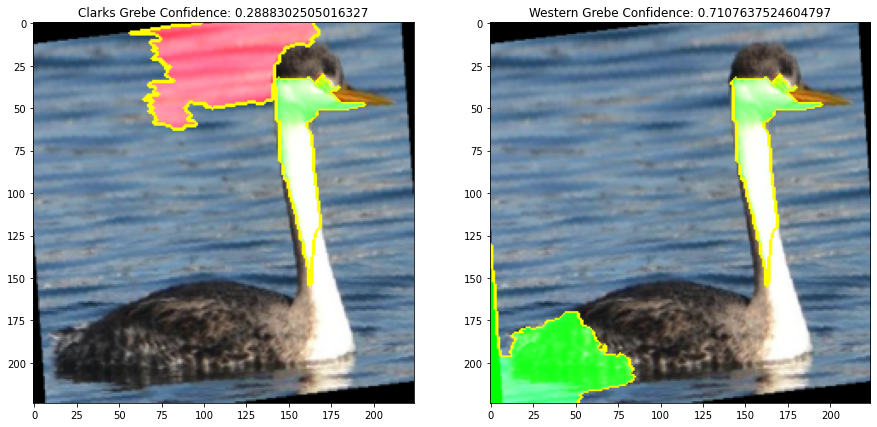

----------------------------------------------------

Image: 32
Actual: Western_Grebe
Predicted: Western_Grebe


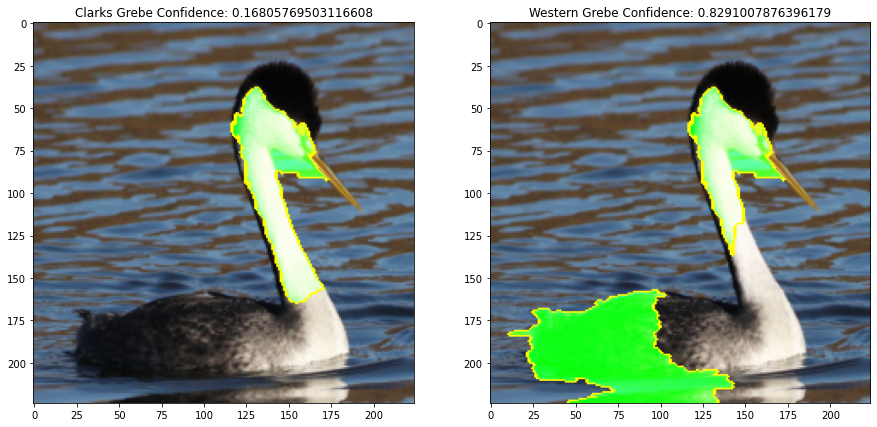


Image: 33
Actual: Western_Grebe
Predicted: Western_Grebe


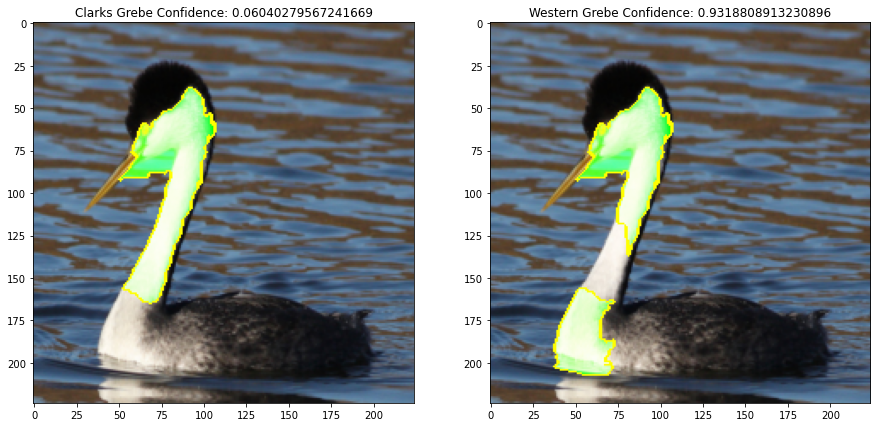


Image: 34
Actual: Western_Grebe
Predicted: Western_Grebe


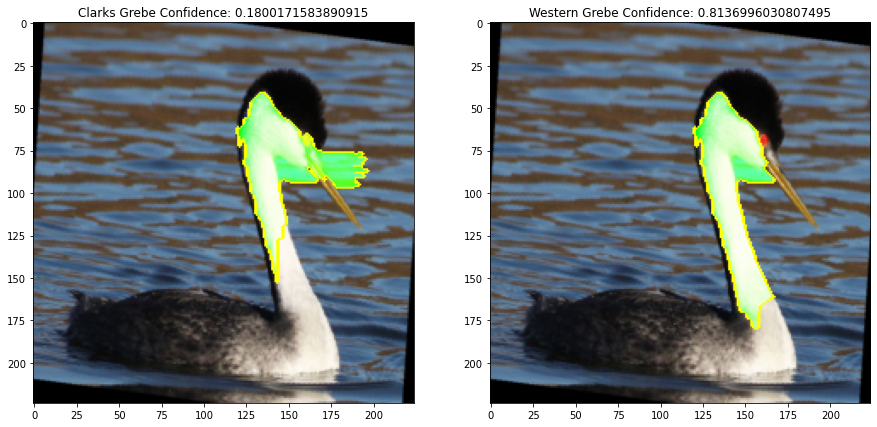


Image: 35
Actual: Western_Grebe
Predicted: Western_Grebe


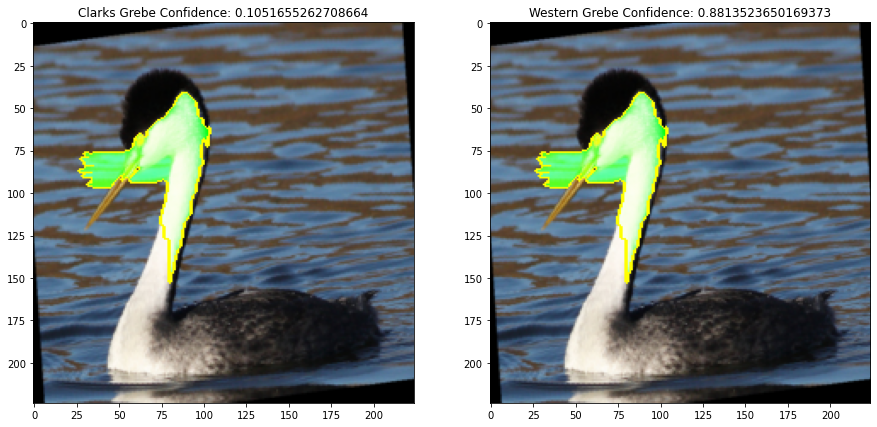

----------------------------------------------------

Image: 36
Actual: Western_Grebe
Predicted: Western_Grebe


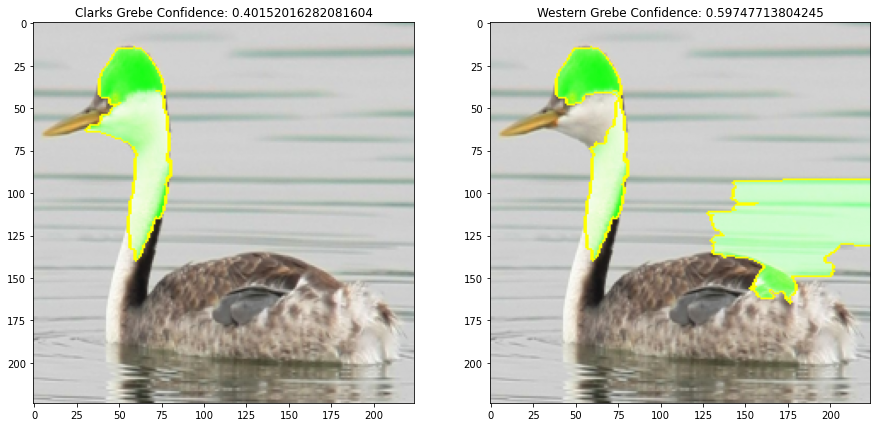


Image: 37
Actual: Western_Grebe
Predicted: Western_Grebe


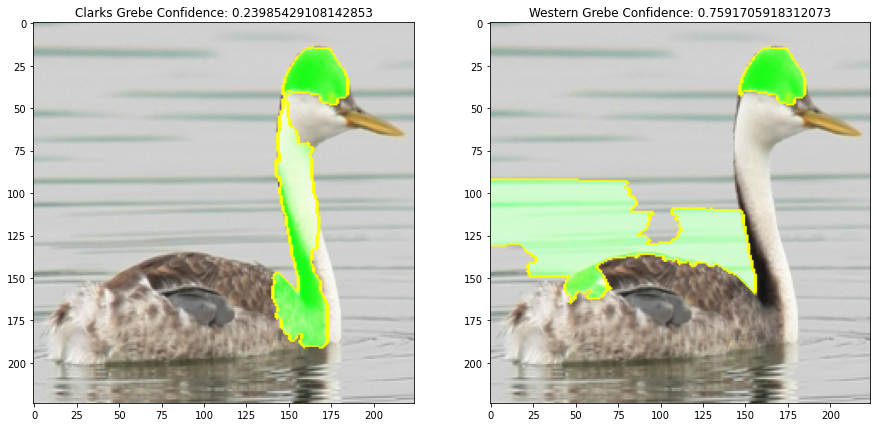


Image: 38
Actual: Western_Grebe
Predicted: Clarks_Grebe


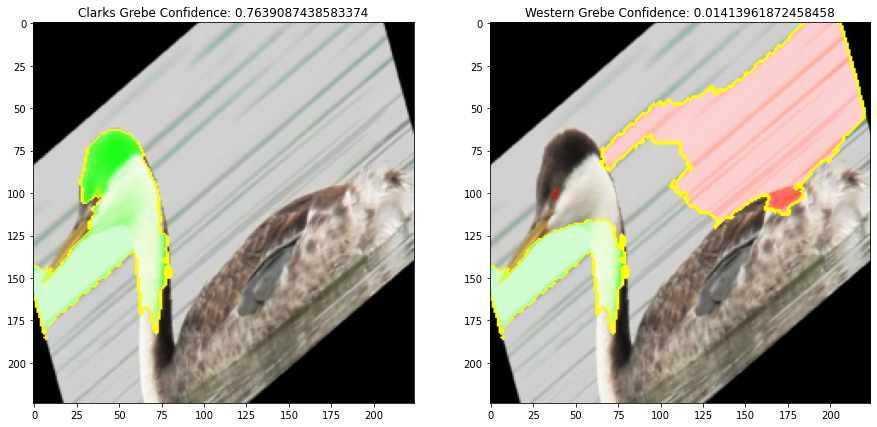


Image: 39
Actual: Western_Grebe
Predicted: Clarks_Grebe


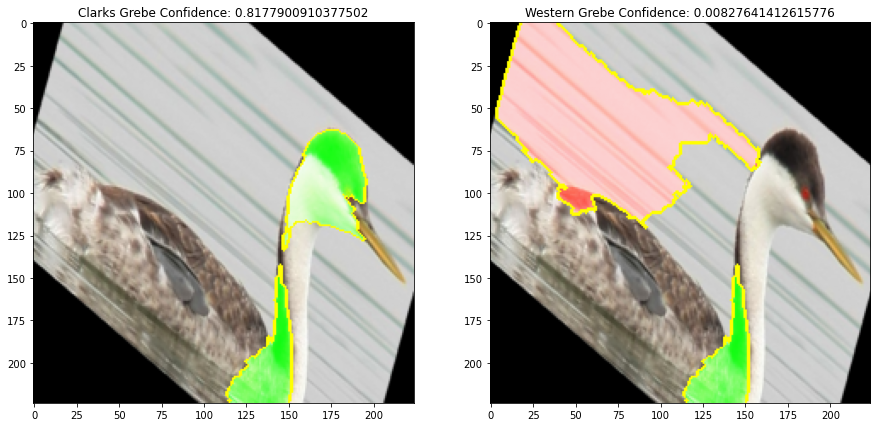

In [30]:
explainer = lime_image.LimeImageExplainer(random_state=RANDOM_STATE)
np.random.seed(RANDOM_STATE)
imgFiles = np.random.choice(grebe_files, size=10)
min_weight = 0.01
i_rank = 0
confidences = []

# Print the most important features
for imgFile in imgFiles:
    img = Image.open(imgFile)
    label = imgFile.split("/")[-2]
    print("----------------------------------------------------")
    for i in getCollection(img):
        prediction = model(normalize(crop(i)).unsqueeze(0))
        index = prediction.argmax(axis=1)[0]
        clark_confidence = softmax(prediction, dim=1)[0][0]
        western_confidence = softmax(prediction, dim=1)[0][5]
        print()
        confidences.append(clark_confidence)
        confidences.append(western_confidence)
        print(f"Image: {i_rank}")
        print(f"Actual: {label}")
        print(f"Predicted: {cat[index]}")
        
        explanation = explainer.explain_instance(image=np.array(i), 
                                                 classifier_fn=lime_model,
                                                 top_labels=12,
                                                 hide_color=0,
                                                 num_samples=500,
                                                 progress_bar=False,
                                                 random_seed=RANDOM_STATE)
        temp, mask = explanation.get_image_and_mask(label=0, # label to explain
                                                positive_only=False, # if True, only take superpixels that positively contribute to the prediction of the label
                                                negative_only=False,
                                                num_features=3, # number of superpixels to include in explanation
                                                hide_rest=False, # if True, make the non-explanation part of the return image gray
                                                min_weight=min_weight * clark_confidence, # Normed. minimum weight of the superpixels to include in explanation
                                               )
        img_boundry1 = mark_boundaries(temp/255.0, mask)
        fig, ax = plt.subplots(1, 2, figsize=(15,8))
        ax[0].imshow(img_boundry1)
        ax[0].set_title(f"Clarks Grebe Confidence: {clark_confidence}")
        temp, mask = explanation.get_image_and_mask(label=5,
                                                positive_only=False, 
                                                negative_only=False,
                                                num_features=3,
                                                hide_rest=False, 
                                                min_weight=min_weight * western_confidence,
                                               )
        img_boundry2 = mark_boundaries(temp/255.0, mask)
        ax[1].imshow(img_boundry2)
        ax[1].set_title(f"Western Grebe Confidence: {western_confidence}")
        plt.show()
        i_rank += 1

A few important things to note:
* It appears that the beak is not an important factor for prediction.
* Both Grebes have some level of water/environment detection when building calculations
* It appears that there is some level of difficulty detecting the differences between faces of the western and clarks grebe
* One of the key features is the "V" shaped outline connection the neck to the body of the birds
* The neck is an important feature for grebe detection

In [37]:
from sklearn.linear_model import LogisticRegression, SGDClassifier

In [38]:
df = pd.read_csv("LIME_samples/metadata.csv")
df["confidence"] = [float(c) for c in confidences]
clark_df = df[df.bird=="clark"]
western_df = df[df.bird=="western"]

In [89]:
X = np.array(df.iloc[:, 4:-1])
weight = np.array(df.iloc[:, -1])
y = np.array(df.bird=="clark").reshape(-1, 1)

In [62]:
y

array([ True, False,  True, False,  True, False,  True, False,  True,
       False,  True, False,  True, False,  True, False,  True, False,
        True, False,  True, False,  True, False,  True, False,  True,
       False,  True, False,  True, False,  True, False,  True, False,
        True, False,  True, False,  True, False,  True, False,  True,
       False,  True, False,  True, False,  True, False,  True, False,
        True, False,  True, False,  True, False,  True, False,  True,
       False,  True, False,  True, False,  True, False,  True, False,
        True, False,  True, False,  True, False,  True, False])

In [106]:
df.columns[4:-1]

Index(['upper_neck', 'bottom_neck', 'face_white', 'face_black', 'water',
       'beak', 'eye', 'wing', 'v_neck_body'],
      dtype='object')

In [103]:
model = LogisticRegression()
model.fit(X, y) #sample_weight=weight)
model.coef_

/home/nick/anaconda3/envs/bird/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


array([[ 0.97850143,  0.00220924,  0.43300094, -0.23207981,  0.0962475 ,
        -0.40037552,  0.09017464,  0.10207325, -0.02221196]])

These coefficients correspond to what the Alex net model looks FOR (as in what parts do each of the Grebes own) when deciphering between the Clarks Grebe (1) and the Western Grebe (0).

Here we see that these traits are important for classifying the Clarks Grebe:
* upper neck
* face white

For Western Grebe:
* face black (the black cap)
* beak

In [108]:
model = LogisticRegression()
model.fit(X, y, sample_weight=weight)
model.coef_

/home/nick/anaconda3/envs/bird/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


array([[ 0.90837312,  0.75275608,  0.87430632, -0.20469585,  0.43059054,
         0.3723396 ,  0.12547925,  0.41268648,  0.03382808]])

With these sample weights, we now have a different interpretation. These coefficients correspond to what the Alex net looks AT (as in what parts of the Grebe does the models compare against one another).

We see that these traits are actually important for comparison:
* upper neck
* face white
* lower neck
* water
* wing
* beak
* face black

NOTE: These logistic regression are trained on a very small sample, with a majority of the sample being permutations or slight altercations of another image contained in the data. Its more than likely that there is some heavy biases occuring due to the lack of data but it is a good first step to understanding the model. 